First we load the required packages.

In [2]:

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns  
import csv
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from scipy.stats import chi2_contingency
from scipy.stats import kruskal
from scipy.stats import pearsonr
from scipy.stats import norm
from matplotlib import cm
from gprofiler import GProfiler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


In [3]:
#df = pd.read_csv('zoonomia_analysis_data_all_proteins_boolean_coverage.csv')
df = pd.read_csv('zoonomia_analysis_data_all_proteins_boolean_coverage_mouse.csv')

df = df.dropna(thresh=df.shape[1] - 4)
#df = df[~df['Species_name'].str.endswith('_2')]
#df = df[df['Instrument_model'] != 'NextSeq 500']
columns_interest = df.filter(like='_g_').columns


Order_columns = df['Order']
species_column = df[['Species_name', 'Species', 'Order', ]]

df.drop(['Species_name', 'Species', 'Order', 'Genome_coverage', 'Inward (Other)', 'Outward (Other)', 'Instrument_model', 'Average_bp_read', 'CMR', 'ICM'], axis=1, inplace=True)
	

# Estandarizar los datos
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Imputar valores faltantes
imputer = SimpleImputer(strategy='mean')
df_imputed = imputer.fit_transform(df_scaled)

df_transformed = pd.DataFrame(df_imputed, columns=df.columns)
df_transformed[['Species_name', 'Species', 'Order']] = species_column


/tmp/ipykernel_14409/758783992.py:2: DtypeWarning: Columns (16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,

In [4]:
df = pd.read_csv('zoonomia_analysis_data_all_proteins_boolean_coverage_mouse.csv')

df = df.dropna(thresh=df.shape[1] - 4)
df.drop(['Species_name', 'Species', 'Order', 'Genome_coverage', 'Inward (Other)', 'Outward (Other)', 'Instrument_model', 'Average_bp_read', 'CMR', 'ICM'], axis=1, inplace=True)


/tmp/ipykernel_14409/1202308422.py:1: DtypeWarning: Columns (16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271

In [5]:
correlation_matrix = df.corr()
correlation_matrix = correlation_matrix.fillna(0)


: 

In [4]:

correlation_matrix.to_csv('Correlation_matrix_fusions_all_proteins_mouse.csv')


: 

In [ ]:
correlation_matrix_df = pd.DataFrame(correlation_matrix)
total_fusions_0 = correlation_matrix_df['Total_fusions_0']
total_fusions = correlation_matrix_df['Total_fusions']
inward_distance_0 = correlation_matrix_df['Inward (Distance 0)']
outward_distance_0 = correlation_matrix_df['Outward (Distance 0)']
variability = correlation_matrix_df['Porcentage_variability']
longevity = correlation_matrix_df['Longevity']

correlation_matrix_2 = pd.concat([total_fusions_0, total_fusions, inward_distance_0, outward_distance_0, longevity, variability ], axis=1)
correlation_matrix_2 = correlation_matrix_2.fillna(0)
correlation_matrix_2.to_excel('Correlation_matrix_fusions_all_proteins_mouse_specific.xlsx')
#correlation_matrix_2.to_excel('Correlation_matrix_fusions_all_proteins_human_specific.xlsx')



/tmp/ipykernel_29933/905370304.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('tab20', len(proteins_to_search))


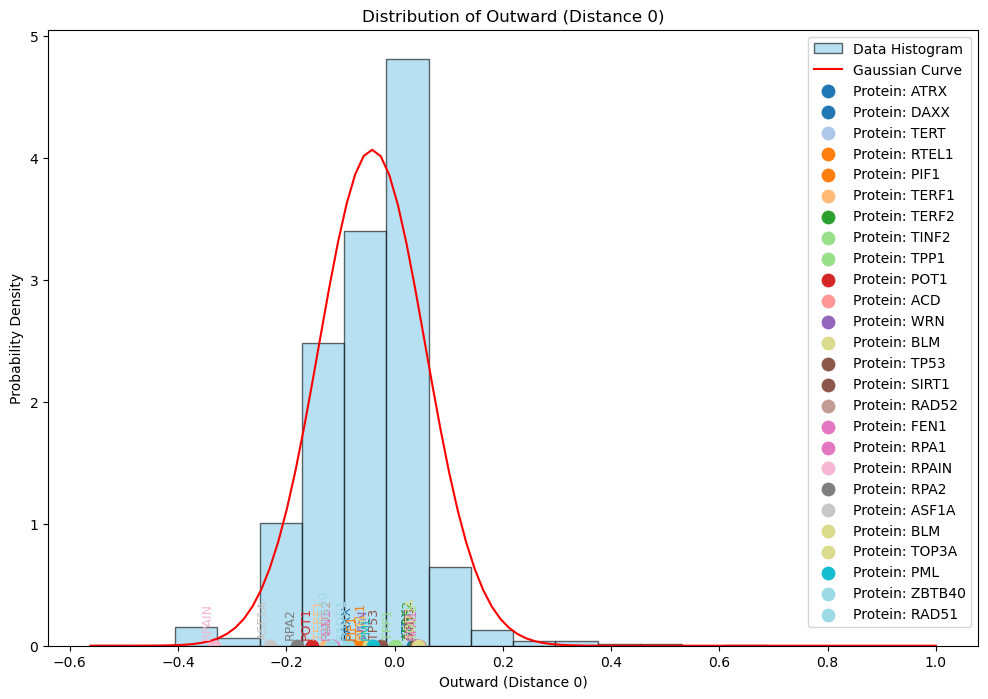

In [ ]:

#column_name = 'Total_fusions_0'
#column_name = 'Total_fusions'
#column_name = 'Inward (Distance 0)'
column_name = 'Outward (Distance 0)'

data = correlation_matrix_2[column_name]

data = data.dropna()

mean = np.mean(data)
std_dev = np.std(data)

x_values = np.linspace(data.min(), data.max(), 100)

pdf_values = norm.pdf(x_values, mean, std_dev)
proteins_to_search = ['ATRX', 'DAXX', 'TERT', 'RTEL1', 'PIF1', "TERF1", "TERF2", "TINF2", "TPP1", "POT1A",'POT1B', "DCR1B", "ACD", "WRN", "BLM", "TP53", "SIRT1", "RAD52", "FEN1", "RPA1", 'RPAIN', 'RPA2', 'ASF1A', 'ASF1B' 'SETDB1', 'RMI', 'BLM', 'TOP3A', 'PML', 'ZBTB40', 'RAD51']

colormap = cm.get_cmap('tab20', len(proteins_to_search))

protein_colors = {protein: colormap(i) for i, protein in enumerate(proteins_to_search)}

plt.figure(figsize=(12, 8))

# histogram 
plt.hist(data, bins=20, color='skyblue', edgecolor='black', density=True, alpha=0.6, label='Data Histogram')

# gaussian
plt.plot(x_values, pdf_values, color='red', label='Gaussian Curve')

plt.xlabel(column_name)
plt.ylabel('Probability Density')
plt.title(f'Distribution of {column_name}')

for protein in proteins_to_search:
    protein_name = f'{protein}_g_ENSG'
    #protein_name = f'{protein}_g_ENSMUSG'


    matching_indices = data.index[data.index.str.contains(protein_name, case=False)]
    
    if not matching_indices.empty:
        for index in matching_indices:
            protein_name_match = index.split('_')[0].upper()

            if protein_name_match == protein:
                protein_value = data.loc[index]

                color = protein_colors[protein]

                plt.scatter(protein_value, 0, color=color, label=f'Protein: {protein}', s=80)
                plt.text(protein_value, 0.05, protein, fontsize=9, color=color, ha='right', va='bottom', rotation=90)

plt.legend()
plt.show()

/tmp/ipykernel_29933/4191568274.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('tab20', len(protein_to_search_telomere))


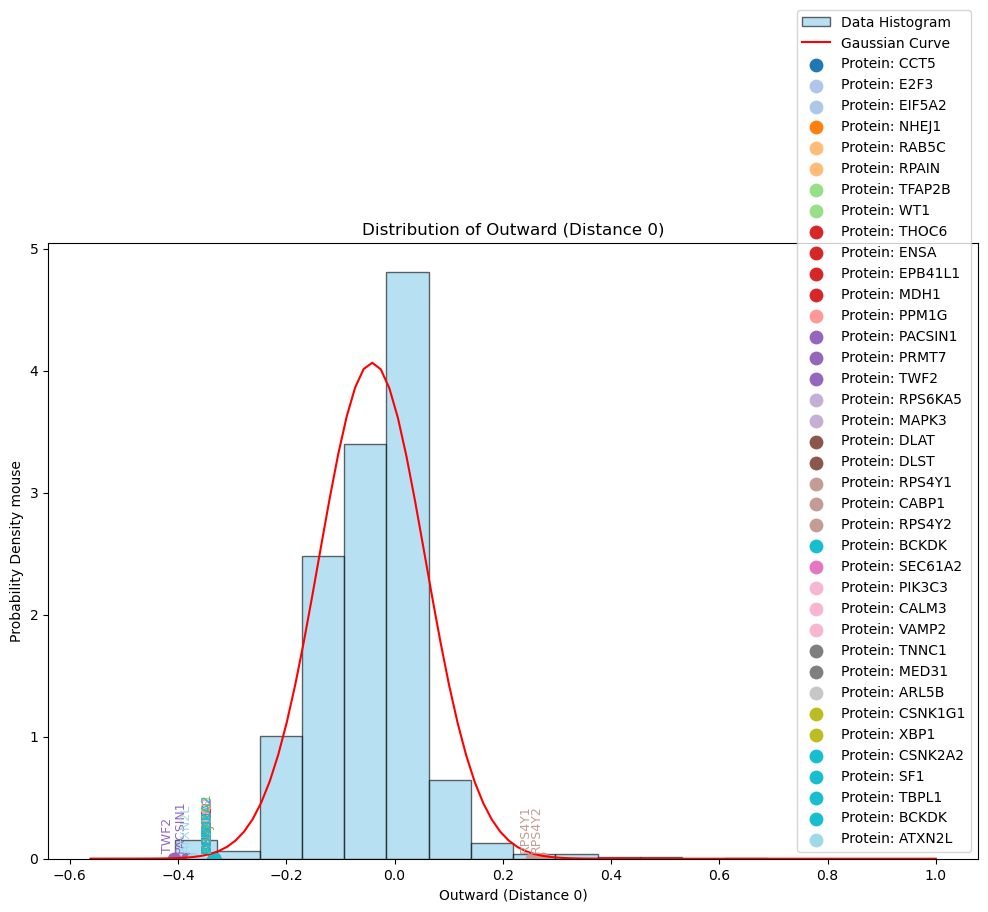

In [15]:
#column_name = 'Total_fusions_0'
#column_name = 'Total_fusions'
#column_name = 'Inward (Distance 0)'
column_name = 'Outward (Distance 0)'

data = correlation_matrix_2[column_name]

data = data.dropna()

mean = np.mean(data)
std_dev = np.std(data)

x_values = np.linspace(data.min(), data.max(), 100)

pdf_values = norm.pdf(x_values, mean, std_dev)
protein_to_search_telomere = pd.read_excel('TelNet.xlsx')
column_2 = protein_to_search_telomere.iloc[:, 1]

colormap = cm.get_cmap('tab20', len(protein_to_search_telomere))
protein_colors = {protein: colormap(i) for i, protein in enumerate(column_2)}

plt.figure(figsize=(12, 8))

# histogram 
plt.hist(data, bins=20, color='skyblue', edgecolor='black', density=True, alpha=0.6, label='Data Histogram')

# gaussian
plt.plot(x_values, pdf_values, color='red', label='Gaussian Curve')

plt.xlabel(column_name)
plt.ylabel('Probability Density mouse')
plt.title(f'Distribution of {column_name}')

for index, value in column_2.items():
    
    protein_name = f'{value}_g_ENSG'
    #protein_name = f'{value}_g_ENSMUSG'


    matching_indices = data.index[data.index.str.contains(protein_name, case=False)]
    
    if not matching_indices.empty:
        for index in matching_indices:
            protein_name_match = index.split('_')[0].upper()
            if protein_name_match == value:

                protein_value = data.loc[index]
                
                color = protein_colors[value]
                if protein_value <= -0.33 or protein_value >= 0.25:
                    plt.scatter(protein_value, 0, color=color, label=f'Protein: {value}', s=80)
                    plt.text(protein_value, 0.05, value, fontsize=9, color=color, ha='right', va='bottom', rotation=90)

plt.legend()
plt.show()

In [2]:
# Ruta del archivo CSV
input_file = 'Correlation_matrix_fusions_all_proteins_mouse.csv'

# Leer las primeras 8 filas con encabezados
top_rows_df = pd.read_csv(input_file, nrows=8)
# Calcular el número total de filas en el archivo
with open(input_file, 'r') as f:
    total_rows = sum(1 for line in f) - 1  # Excluyendo encabezados

# Calcular el número de filas a saltar para leer las últimas 6 filas
skip_rows = total_rows - 6

bottom_rows_df = pd.read_csv(input_file, skiprows=skip_rows, nrows=6)

bottom_rows_df.columns = top_rows_df.columns

# Concatenar los dos DataFrames en el eje 0 (filas)
final_df = pd.concat([top_rows_df, bottom_rows_df], axis=0, ignore_index=True)



                  Unnamed: 0  Inward (Distance 0)  Outward (Distance 0)  \
0        Inward (Distance 0)             1.000000              0.838845   
1       Outward (Distance 0)             0.838845              1.000000   
2              Total_fusions             0.567035              0.515700   
3            Total_fusions_0             0.979332              0.931611   
4               Total_inward             0.481247              0.392532   
5              Total_outward             0.641308              0.698160   
6                  Longevity             0.177510              0.248000   
7                  Chrom_num             0.046295              0.017459   
8       Total_telomere_reads             0.549819              0.416297   
9                Genome_size             0.175868              0.113160   
10         Porcentage_TTAGGG             0.045012              0.035397   
11    Porcentage_variability            -0.045012             -0.035397   
12       Total_telomere_s

In [3]:
final_df = final_df.set_index('Unnamed: 0')
final_df = final_df.fillna(0)

In [5]:

p_values_dict = {}

# Iterar sobre todas las combinaciones de columnas en final_df
for i, column1 in enumerate(final_df.columns):
    p_values_dict[column1] = []
    for j, column2 in enumerate(final_df.columns):
        if i != j:  # Solo calcular la correlación si las columnas son diferentes
            coef, p_value = pearsonr(final_df[column1], final_df[column2])
            # Almacenar el valor p en el diccionario
            p_values_dict[column1].append(p_value)
        else:
            # Cuando i = j, p_value es igual a 1 (autocorrelación)
            p_values_dict[column1].append(1)

# Convertir el diccionario de valores p en un DataFrame
p_values_df = pd.DataFrame(p_values_dict, index=final_df.columns)

# Guardar los valores p en un archivo CSV
p_values_df.to_csv('p_value_all_proteins_mouse_correlation_matrix.csv')

/tmp/ipykernel_21391/3591097561.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  coef, p_value = pearsonr(final_df[column1], final_df[column2])


In [ ]:
p_values_df.to_csv('Hasta_el_chichi.csv')

In [15]:
input_file = 'Correlation_matrix_fusions_all_proteins_mouse.csv'
output_file = 'p_values_all_proteins_correlation_matrix_mouse.csv'


first_five = correlation_matrix.columns[:8]
last_five = correlation_matrix.columns[-6:]
del(correlation_matrix)
first_five = list(first_five)
last_five = list(last_five)
columns_of_interest = first_five + last_five


# Abrir el archivo CSV para escritura
with open(input_file, 'r') as input_csv, open(output_file, 'w', newline='') as output_csv:
    input_reader = csv.reader(input_csv)
    output_writer = csv.writer(output_csv)
    
    # Leer la primera línea como encabezados y escribirlos en el archivo de salida
    headers = next(input_reader)
    output_writer.writerow([''] + headers)
    
    # Índices de las columnas de interés
    column_indices = [headers.index(column) for column in columns_of_interest]
    
    # Iterar sobre cada fila del archivo de entrada
    for row in input_reader:
        # Iterar sobre las columnas de interés
        for i, column1 in enumerate(columns_of_interest):
            p_values_row = [column1]
            
            # Iterar sobre todas las columnas
            for j, column2 in enumerate(headers):
                if column1 != column2:
                    # Convertir las columnas a arrays numéricos
                    data_column1 = np.array([float(row[column_indices[i]])])
                    data_column2 = np.array([float(row[j])])
                    
                    # Calcular coeficiente de Pearson y valor p
                    coef, p_value = pearsonr(data_column1, data_column2)
                else:
                    p_value = 1
                
                # Añadir el valor p a la fila
                p_values_row.append(p_value)
            
            # Escribir la fila completa en el archivo de salida
            output_writer.writerow(p_values_row)


: 

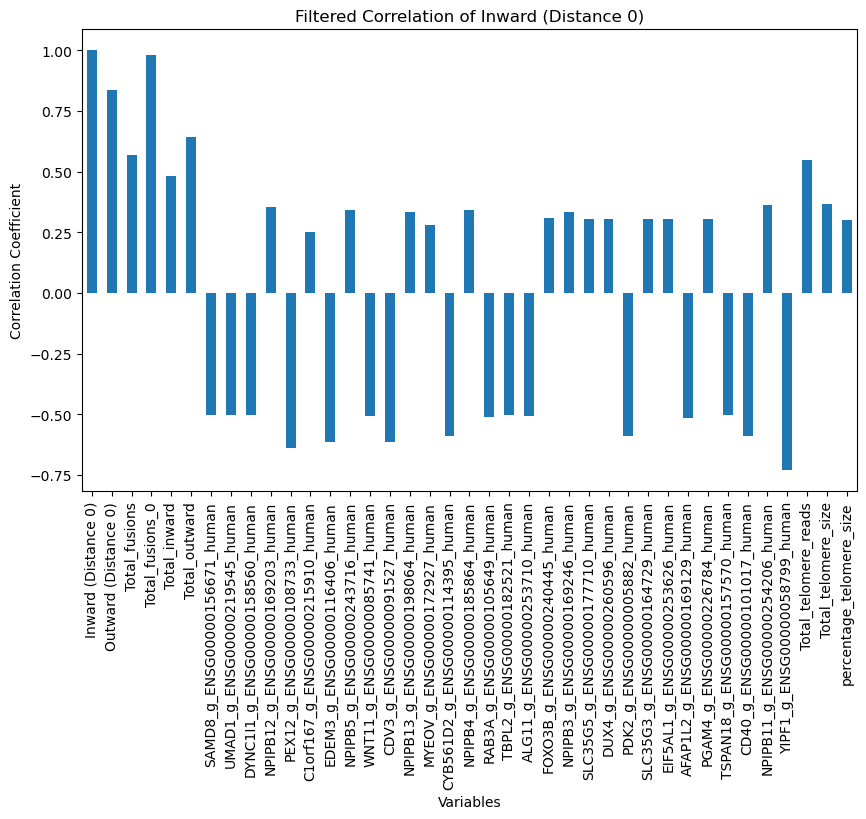

In [31]:
correlation_with_Inward_0 = correlation_matrix_2['Inward (Distance 0)']
filtered_correlations_inward_0 = correlation_with_Inward_0[(correlation_with_Inward_0 < -0.50) | (correlation_with_Inward_0 > 0.25)]

# Graficar los valores filtrados
plt.figure(figsize=(10, 6))
filtered_correlations_inward_0.plot(kind='bar')
plt.title('Filtered Correlation of Inward (Distance 0)')
plt.xlabel('Variables')
plt.ylabel('Correlation Coefficient')
plt.show()

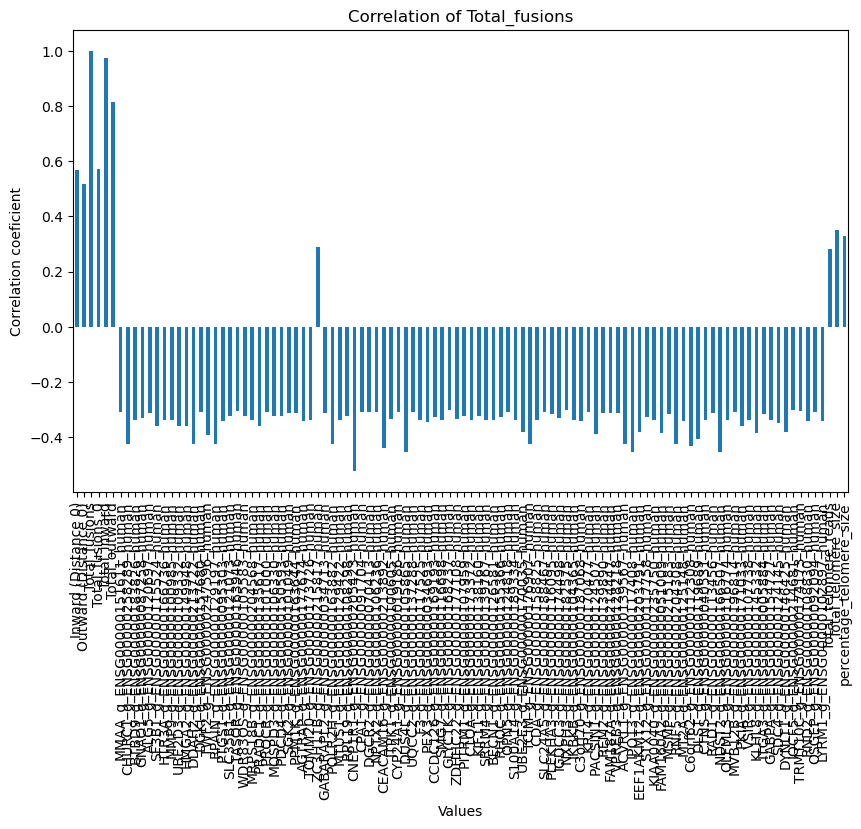

In [32]:
correlation_with_total_fusions= correlation_matrix['Total_fusions']
filtered_correlations_total = correlation_with_total_fusions[(correlation_with_total_fusions < -0.30) | (correlation_with_total_fusions > 0.25)]

plt.figure(figsize=(10, 6))
filtered_correlations_total.plot(kind='bar')
plt.title('Correlation of Total_fusions')
plt.xlabel('Values')
plt.ylabel('Correlation coeficient')
plt.show()

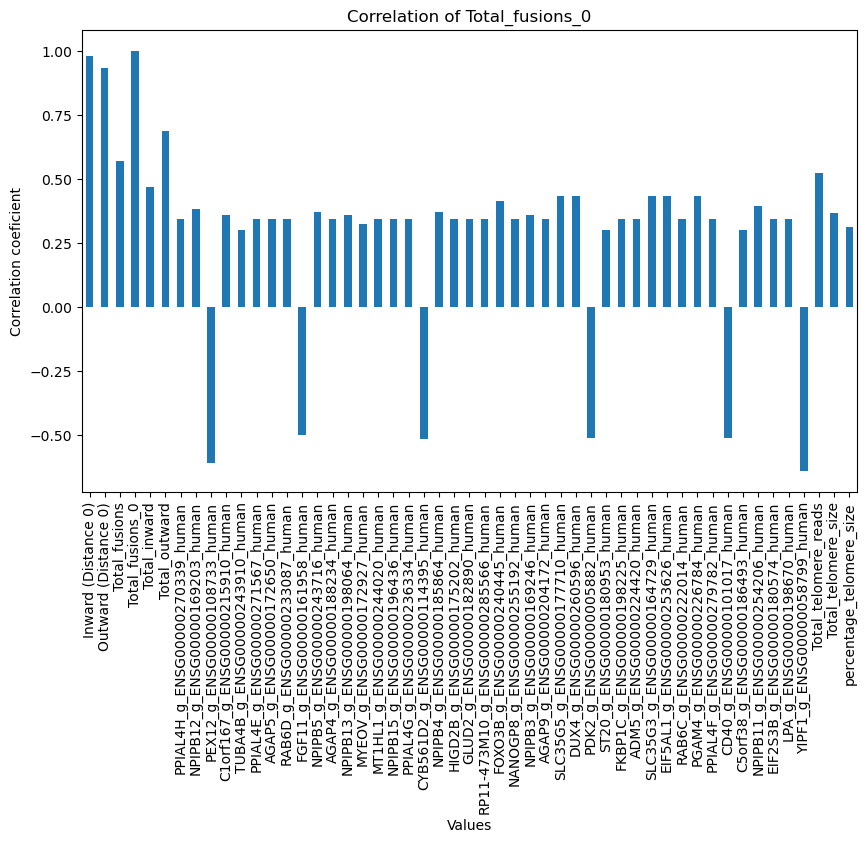

In [33]:
correlation_with_total_fusions_0= correlation_matrix['Total_fusions_0']
filtered_correlations_total_0 = correlation_with_total_fusions_0[(correlation_with_total_fusions_0 < -0.50) | (correlation_with_total_fusions_0 > 0.30)]

plt.figure(figsize=(10, 6))
filtered_correlations_total_0.plot(kind='bar')
plt.title('Correlation of Total_fusions_0')
plt.xlabel('Values')
plt.ylabel('Correlation coeficient')
plt.show()

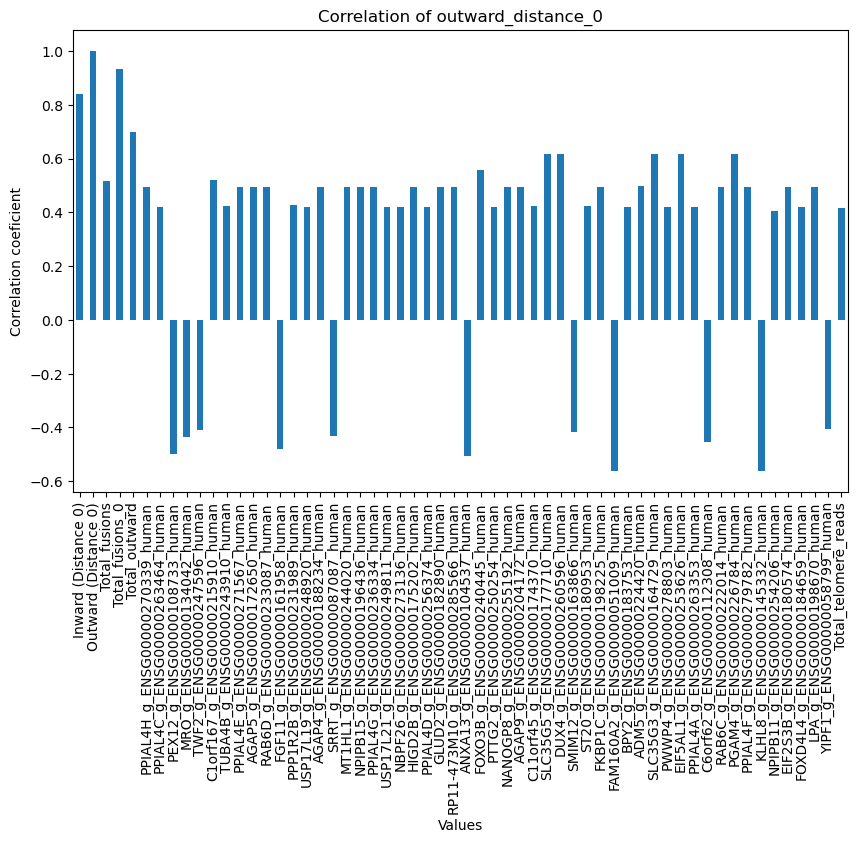

In [34]:

correlation_with_outward_distance_0= correlation_matrix['Outward (Distance 0)']
filtered_correlations_outward_0 = correlation_with_outward_distance_0[(correlation_with_outward_distance_0 < -0.40) | (correlation_with_outward_distance_0 > 0.40)]

plt.figure(figsize=(10, 6))
filtered_correlations_outward_0.plot(kind='bar')
plt.title('Correlation of outward_distance_0')
plt.xlabel('Values')
plt.ylabel('Correlation coeficient')
plt.show()

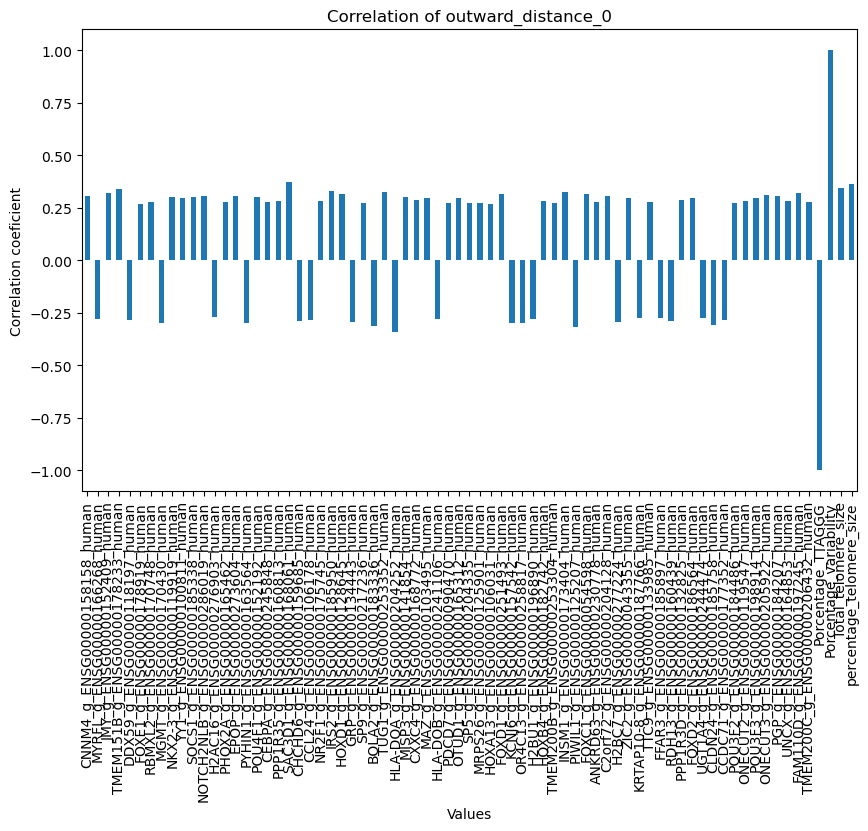

In [39]:
correlation_with_outward_distance_0= correlation_matrix['Porcentage_variability']
filtered_correlations_outward_0 = correlation_with_outward_distance_0[(correlation_with_outward_distance_0 < -0.27) | (correlation_with_outward_distance_0 > 0.27)]

plt.figure(figsize=(10, 6))
filtered_correlations_outward_0.plot(kind='bar')
plt.title('Correlation of outward_distance_0')
plt.xlabel('Values')
plt.ylabel('Correlation coeficient')
plt.show()

In [44]:
df = pd.read_csv('zoonomia_analysis_data_all_proteins_selection_raw.csv')
df = df[df['Instrument_model'] != 'NextSeq 500']
#df = df[~df['Species_name'].str.endswith('_2')]
# Lista de columnas de proteínas
protein_columns = df.filter(like='_g_').columns


order_p_values = {}

grouped_df = df.groupby('Order')

for order, group in grouped_df:
    species_p_values = {}
    
    for protein in protein_columns:
        contingency_table = pd.crosstab(group[protein], group['Fusion_category'])
        
        if contingency_table.size > 0 and contingency_table.sum().sum() > 0:
            _, p_value, _, _ = chi2_contingency(contingency_table)
            
            species_p_values[protein] = p_value
        else:
            species_p_values[protein] = float('nan')  
    order_p_values[order] = species_p_values

df_order_p_values = pd.DataFrame(order_p_values)
row_means = df_order_p_values.mean(axis=1)
col_means = df_order_p_values.mean(axis=0)

df_order_p_values_sorted = df_order_p_values.reindex(row_means.sort_values().index)
df_order_p_values_sorted = df_order_p_values_sorted.reindex(columns=col_means.sort_values().index)


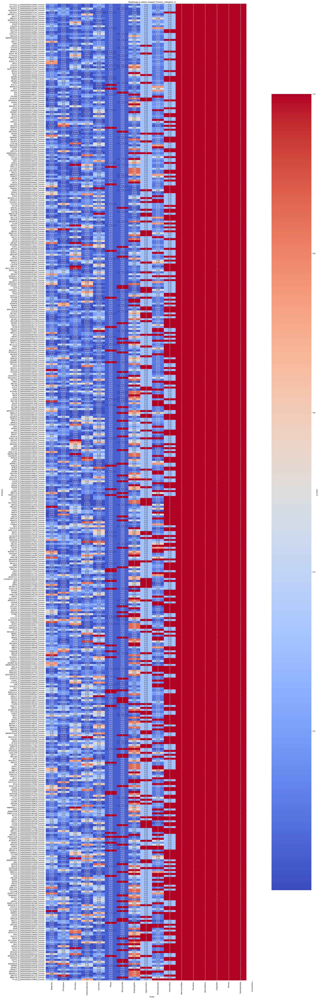

In [45]:

df_order_p_values_sorted_500 = df_order_p_values_sorted.head(500)

fig_width = max(8, df_order_p_values_sorted_500.shape[1] * 1.5)
fig_height = max(8, df_order_p_values_sorted_500.shape[0] * 0.2)

plt.figure(figsize=(fig_width, fig_height))
sns.heatmap(df_order_p_values_sorted_500, annot=True, cmap='coolwarm', cbar_kws={'label': 'p-value'})
plt.title('Heatmap p-valios respect Fusion_category_0')
plt.xlabel('Order')
plt.ylabel('Proteins')
plt.show()

In [ ]:
df = pd.read_csv('zoonomia_analysis_data_all_proteins_coverage_category.csv')
#df = df[df['Instrument_model'] != 'NextSeq 500']
#df = df[~df['Species_name'].str.endswith('_2')]
df = df.dropna(thresh=df.shape[1] - 4)
# Lista de columnas de proteínas
protein_columns = df.filter(like='_g_').columns
total_fusions_0 = df['Total_fusions_0']
Inward_0 = df['Inward (Distance 0)']
Outward_0 = df['Outward (Distance 0)']
variability = df['Porcentage_variability']
telomere_size = df['Total_telomere_size']


p_values_k_I = {}
p_values_k_O = {}
p_values_k_T = {}
p_values_k_V = {}
p_values_k_S = {}

for protein in protein_columns:
    group_T = [total_fusions_0[df[protein] == category] for category in ['P', 'A', 'U']]
    group_I = [Inward_0[df[protein] == category] for category in ['P', 'A', 'U']]
    group_O = [Outward_0[df[protein] == category] for category in ['P', 'A', 'U']]
    group_V = [variability[df[protein] == category] for category in ['P', 'A', 'U']]
    group_S = [telomere_size[df[protein] == category] for category in ['P', 'A', 'U']]
    
    stat, p_value_t = kruskal(*group_T)
    stat, p_value_i = kruskal(*group_I)
    stat, p_value_o = kruskal(*group_O)
    stat, p_value_v = kruskal(*group_V)
    stat, p_value_s = kruskal(*group_S)

    p_values_k_T[protein] = p_value_t
    p_values_k_I[protein] = p_value_o
    p_values_k_O[protein] = p_value_i
    p_values_k_V[protein] = p_value_v
    p_values_k_S[protein] = p_value_s



In [11]:
df = pd.read_csv('zoonomia_analysis_data_all_proteins_boolean_coverage_mouse.csv')
#df = df[df['Instrument_model'] != 'NextSeq 500']
#df = df[~df['Species_name'].str.endswith('_2')]
df = df.dropna(thresh=df.shape[1] - 4)
# Lista de columnas de proteínas
protein_columns = df.filter(like='_g_').columns
total_fusions_0 = df['Total_fusions_0']
Inward_0 = df['Inward (Distance 0)']
Outward_0 = df['Outward (Distance 0)']
variability = df['Porcentage_variability']
telomere_size = df['Total_telomere_size']


p_values_k_I = {}
p_values_k_O = {}
p_values_k_T = {}
p_values_k_V = {}
p_values_k_S = {}

for protein in protein_columns:
    group_T = [total_fusions_0[df[protein] == category] for category in [True, False]]
    group_I = [Inward_0[df[protein] == category] for category in [True, False]]
    group_O = [Outward_0[df[protein] == category] for category in [True, False]]
    group_V = [variability[df[protein] == category] for category in [True, False]]
    group_S = [telomere_size[df[protein] == category] for category in [True, False]]
    
    stat, p_value_t = kruskal(*group_T)
    stat, p_value_i = kruskal(*group_I)
    stat, p_value_o = kruskal(*group_O)
    stat, p_value_v = kruskal(*group_V)
    stat, p_value_s = kruskal(*group_S)

    p_values_k_T[protein] = p_value_t
    p_values_k_I[protein] = p_value_o
    p_values_k_O[protein] = p_value_i
    p_values_k_V[protein] = p_value_v
    p_values_k_S[protein] = p_value_s


/tmp/ipykernel_29850/3572417664.py:1: DtypeWarning: Columns (16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271

In [16]:
# Convierte los diccionarios de p-values en Series de pandas
p_values_T_series = pd.Series(p_values_k_T, name='Total_fusions_0_p_value')
p_values_I_series = pd.Series(p_values_k_I, name='Inward_0_p_value')
p_values_O_series = pd.Series(p_values_k_O, name='Outward_0_p_value')
p_values_V_series = pd.Series(p_values_k_V, name='Porcentage_variability_p_value')
p_values_S_series = pd.Series(p_values_k_S, name='Total_telomere_size_p_value')

# Combina las Series en un DataFrame
result_df = pd.concat([p_values_T_series, p_values_I_series, p_values_O_series, p_values_V_series, p_values_S_series], axis=1)
print(result_df)
# Guarda el DataFrame resultante en un archivo CSV
result_df.to_excel('kruskal_all_proteins_mouse_p_values.xlsx', index=True)

                                      Total_fusions_0_p_value  \
Stau2_g_ENSMUSG00000025920_mouse                     0.006634   
Jmjd4_g_ENSMUSG00000036819_mouse                     0.324214   
Rad51b_g_ENSMUSG00000059060_mouse                    0.969954   
Emsy_g_ENSMUSG00000035401_mouse                      0.425773   
Grn_g_ENSMUSG00000034708_mouse                       0.135052   
...                                                       ...   
Amy2a1_g_ENSMUSG00000070360_mouse                    0.793531   
Ighv1-11_g_ENSMUSG00000102888_mouse                  0.928937   
Ighv1-81_g_ENSMUSG00000094689_mouse                  0.312831   
Trav13n-2_g_ENSMUSG00000094779_mouse                 0.604822   
Ighv7-1_g_ENSMUSG00000076665_mouse                   0.011492   

                                      Inward_0_p_value  Outward_0_p_value  \
Stau2_g_ENSMUSG00000025920_mouse              0.024638           0.036370   
Jmjd4_g_ENSMUSG00000036819_mouse              0.627477           

In [18]:

# Cargar los datos desde el archivo Excel
archivo = 'kruskal_all_proteins_mouse_p_values.xlsx'
data = pd.read_excel(archivo, index_col=0)
data.fillna(1)
data_genes = data[data.index.str.contains('_g_')]
data_genes.loc[:, 'Protein'] = data_genes.index.str.split('_').str[0]
data_genes.loc[:, 'Gene'] = data_genes.index.str.split('_').str[2]

threshold = 0.01
gene_scores = data_genes.set_index(data_genes.columns[6])['Total_fusions_0_p_value']
gene_scores = gene_scores[gene_scores <= threshold]
genes_to_analyze = gene_scores.index.tolist()
print(genes_to_analyze)
# Crear una instancia de GProfiler
gp = GProfiler(return_dataframe=True)

results = gp.profile(
    organism='mmusculus',  
    query=genes_to_analyze,
    sources=['GO', 'KEGG']  )

print(results)
results.to_excel('GSEA_mouse_all_proteins.xlsx')


['ENSMUSG00000025920', 'ENSMUSG00000006057', 'ENSMUSG00000050821', 'ENSMUSG00000057425', 'ENSMUSG00000044017', 'ENSMUSG00000037393', 'ENSMUSG00000056121', 'ENSMUSG00000053646', 'ENSMUSG00000059534', 'ENSMUSG00000028766', 'ENSMUSG00000050089', 'ENSMUSG00000037716', 'ENSMUSG00000052752', 'ENSMUSG00000002102', 'ENSMUSG00000051910', 'ENSMUSG00000011154', 'ENSMUSG00000015970', 'ENSMUSG00000034252', 'ENSMUSG00000030798', 'ENSMUSG00000070003', 'ENSMUSG00000024150', 'ENSMUSG00000024664', 'ENSMUSG00000021765', 'ENSMUSG00000102418', 'ENSMUSG00000075156', 'ENSMUSG00000022129', 'ENSMUSG00000049047', 'ENSMUSG00000063137', 'ENSMUSG00000040479', 'ENSMUSG00000021751', 'ENSMUSG00000037876', 'ENSMUSG00000071909', 'ENSMUSG00000000365', 'ENSMUSG00000040621', 'ENSMUSG00000069296', 'ENSMUSG00000020882', 'ENSMUSG00000046991', 'ENSMUSG00000055820', 'ENSMUSG00000021978', 'ENSMUSG00000004849', 'ENSMUSG00000032725', 'ENSMUSG00000051184', 'ENSMUSG00000113846', 'ENSMUSG00000003847', 'ENSMUSG00000032519', 'ENSMUSG0

In [33]:
df = pd.read_csv('zoonomia_analysis_data_all_proteins_boolean_coverage.csv')

y = df['Total_fusions_0']
X = df.filter(like='_g_')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestRegressor(random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

# Analizar la importancia de las características
feature_importances = rf.feature_importances_

# Crear un DataFrame con las características y su importancia
feature_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': feature_importances
})

# Ordenar por importancia
feature_importance_df.sort_values(by='importance', ascending=False, inplace=True)

print(feature_importance_df.head(100))


/tmp/ipykernel_29850/1116986765.py:1: DtypeWarning: Columns (16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271

Mean Squared Error: 1548071.34275486
R^2 Score: 0.1861012953058646
                               feature  importance
10092    KMT2C_g_ENSG00000055609_human    0.057028
6654    ATXN2L_g_ENSG00000168488_human    0.036208
17013  C6orf62_g_ENSG00000112308_human    0.034094
5005     FGF11_g_ENSG00000161958_human    0.031559
17964    KLHL8_g_ENSG00000145332_human    0.029653
...                                ...         ...
7808    LMAN1L_g_ENSG00000140506_human    0.002192
8086     KCTD2_g_ENSG00000180901_human    0.002159
5660     AGAP4_g_ENSG00000188234_human    0.002149
8326     CTRB2_g_ENSG00000168928_human    0.002127
10542   LPCAT4_g_ENSG00000176454_human    0.002122

[100 rows x 2 columns]


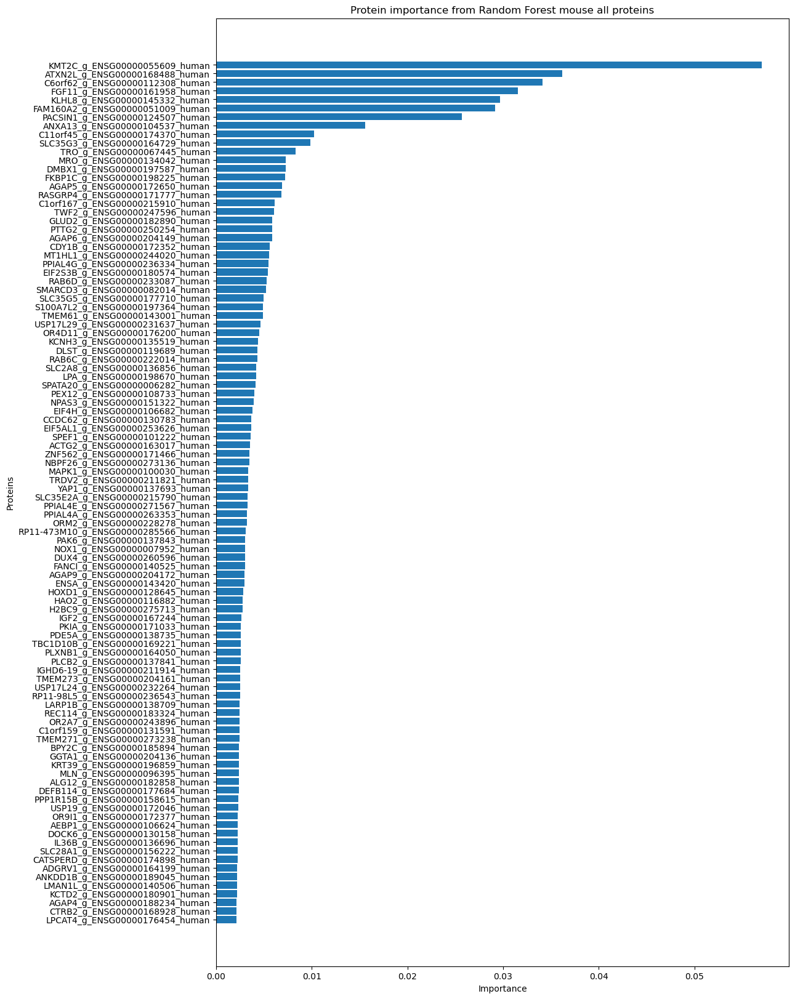

In [34]:
feature_importance_df_sorted = feature_importance_df.sort_values(by='importance', ascending=False)
feature_importance_df_sorted = feature_importance_df_sorted.head(100)
num_features = len(feature_importance_df_sorted)
figsize = (12, max(5, num_features / 5))
plt.figure(figsize=figsize)
plt.barh(feature_importance_df_sorted['feature'], feature_importance_df_sorted['importance'])
plt.xlabel('Importance')
plt.ylabel('Proteins')
plt.title('Protein importance from Random Forest mouse all proteins')
plt.gca().invert_yaxis() 
plt.show()